# Streamflow daily averages from v2.1 retrospective
_James McCreight_

Calculating daily averages from hourly model output on all 2.777 million NWM 
stream reaches for nearly 42 years of output. This is a fairly large data 
problem. We could maybe do this in memory, but it might be tedious.  

To compute it relatively quickly and not worry about memory, we'll use 2 layers
of parallelism. (I also wanted to prove the viability of following approach 
suggested by Rich Signell). This is possible as we'll define a Zarr store of 
full dimensions but with no data in it. Then we'll write to the Zarr store by 
independent regions. The source data for the ouput regions are also independent 
in the input data, we process each spatial chunk of the input for all time 
(chunks), calculate the daily averages, rechunk the data, and write to the 
output region. 

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
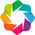

In [1]:
# Using virtual environment /glade/work/jamesmcc/python_envs/712gc
import os

if 'DASK_ROOT_CONFIG' in os.environ:
    del os.environ['DASK_ROOT_CONFIG']
import dask
from dask.distributed import Client, progress, LocalCluster, performance_report
from dask_jobqueue import PBSCluster
(dask.config.config
 .get('distributed')
 .get('dashboard')
 .update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'}))

import geoviews as gv
import holoviews as hv
from holoviews.operation.datashader import rasterize
import hvplot
import hvplot.xarray
import hvplot.pandas
import cartopy.crs as ccrs
hv.extension('bokeh')
hv.opts.defaults(
    hv.opts.Scatter(width=700, height=500) )

import math
import numpy as np
import pathlib
import shutil
import time
import xarray as xr
import zarr as zr

In [2]:
def wait_for_workers(n_workers_start, client, sleep_sec=5):
    n_workers_active = 0    
    while n_workers_active < n_workers_start:
        client_repr = repr(client)
        n_workers_active = int(client_repr.split('processes=')[1].split(' ')[0])
        print(f'Have {n_workers_active}/{n_workers_start} dask workers needed to start job.')
        time.sleep(sleep_sec)

## Analysis of chunk sizes

We'll get a dask cluster for distributed computation, when it arises.

In [3]:
cluster = PBSCluster(
    cores=1, 
    queue='casper', 
    project='NRAL0017', 
    memory='20GB', 
    walltime='08:00:00',
    death_timeout=75)

n_workers = 10
n_workers_start = math.floor(n_workers / 2)    
cluster.scale(jobs=n_workers)
client = Client(cluster)
wait_for_workers(n_workers_start, client)
client

Have 0/5 dask workers needed to start job.
Have 1/5 dask workers needed to start job.
Have 10/5 dask workers needed to start job.


<Client: 'tcp://128.117.208.105:39056' processes=10 threads=10, memory=186.30 GiB>

In [4]:
file_chrtout = '/glade/p/datashare/ishitas/nwm_retro_v2.1/chrtout.zarr'

Look at the streamflow variable in xarray, as it would be used in memory. 

In [5]:
da_streamflow = (
    xr.open_zarr(file_chrtout)
    .streamflow.drop(['longitude', 'latitude', 'elevation', 'gage_id', 'order']))
display(da_streamflow)

<xarray.DataArray 'streamflow' (time: 367439, feature_id: 2776738)>
dask.array<xarray-streamflow, shape=(367439, 2776738), dtype=float64, chunksize=(672, 30000), chunktype=numpy.ndarray>
Coordinates:
  * feature_id  (feature_id) int32 101 179 181 ... 1180001803 1180001804
  * time        (time) datetime64[ns] 1979-02-01T01:00:00 ... 2020-12-31T23:0...
Attributes:
    grid_mapping:  crs
    long_name:     River Flow
    units:         m3 s-1

In [6]:
dz = zr.open(file_chrtout)

Look at the streamflow variable in Zarr, which gives some insight on chunk storage size on disk. We want chunk sizes to be in the 300-500MB range (max).

In [7]:
vv = 'streamflow'
info = dz[vv].info
print(f"zarr dz[{vv}].info:\n")
display(info)
chunk_bytes = np.prod(info.obj.chunks) * info.obj.dtype.itemsize
storage_ratio = float(str(info.obj._info_reporter).split(':')[-2].split('\n')[0].split(' ')[1])
print(f"Un-Compressed Chunk size in MB: {chunk_bytes / 1048576}")
print(f"   Compressed Chunk size in MB: {chunk_bytes / 1048576 / storage_ratio}") 

zarr dz[streamflow].info:



Name,/streamflow
Type,zarr.core.Array
Data type,int32
Shape,"(367439, 2776738)"
Chunk shape,"(672, 30000)"
Order,C
Read-only,False
Compressor,"Blosc(cname='lz4', clevel=5, shuffle=SHUFFLE, blocksize=0)"
Store type,zarr.storage.DirectoryStore
No. bytes,4081127335928 (3.7T)
No. bytes stored,754124414981 (702.3G)


Un-Compressed Chunk size in MB: 76.904296875
   Compressed Chunk size in MB: 14.241536458333332


In [8]:
da_streamflow_daily = da_streamflow.resample(time="1D").mean()

In [9]:
display(da_streamflow_daily)

<xarray.DataArray 'streamflow' (time: 15310, feature_id: 2776738)>
dask.array<stack, shape=(15310, 2776738), dtype=float64, chunksize=(1, 30000), chunktype=numpy.ndarray>
Coordinates:
  * time        (time) datetime64[ns] 1979-02-01 1979-02-02 ... 2020-12-31
  * feature_id  (feature_id) int32 101 179 181 ... 1180001803 1180001804

The time chunk sizes are going from 672 hours (28 days) to 15310 days (full time). If the original chunk sizes 
(uncompressed and compressed) are indicative, the new chunk sizes would be 

```
   compressed: 14.24MB / 672 * 15310 = 324.5MB
   uncompressed: 76.9MB / 672 * 15310 = 1752MB
```

We probably want to reduce that about a factor of 3 in the spatial/feature_id dimension, that is move from
30,000 chunk size to 10,000 chunk size. Remember that these chunk sizes are for the int32 storage type.

In [10]:
da_streamflow_daily_rechunked = da_streamflow_daily.chunk({'time': 15310, 'feature_id': 10000})

In [11]:
display(da_streamflow_daily_rechunked)

<xarray.DataArray 'streamflow' (time: 15310, feature_id: 2776738)>
dask.array<rechunk-merge, shape=(15310, 2776738), dtype=float64, chunksize=(15310, 10000), chunktype=numpy.ndarray>
Coordinates:
  * time        (time) datetime64[ns] 1979-02-01 1979-02-02 ... 2020-12-31
  * feature_id  (feature_id) int32 101 179 181 ... 1180001803 1180001804

So what xarray reports is the uncompressed representation as float64 (after scale\_factor and add\_offset attributes are applied) , 1752MB/3*2 = 1168MB (not GiB).

This seems like a reasonable chunking situation until we determine othwerwise.

## Process the data

Create a Zarr store that is empty of data but which has it's chunking scheme defined

In [12]:
file_zarr = pathlib.Path('/glade/scratch/jamesmcc/streamflow_daily/streamflow_daily.zarr')

In [13]:
%%time
if not file_zarr.exists():
    _ = (
        da_streamflow_daily_rechunked
        .to_dataset()
        .to_zarr(file_zarr, compute=False, consolidated=True))

CPU times: user 0 ns, sys: 354 µs, total: 354 µs
Wall time: 3.47 ms


From an `display()` point of view, this will look the same before and after the processing.

In [14]:
ds_daily = xr.open_zarr(file_zarr)
display(ds_daily)
ds_daily.close()

<xarray.Dataset>
Dimensions:     (feature_id: 2776738, time: 15310)
Coordinates:
  * feature_id  (feature_id) int32 101 179 181 ... 1180001803 1180001804
  * time        (time) datetime64[ns] 1979-02-01 1979-02-02 ... 2020-12-31
Data variables:
    streamflow  (time, feature_id) float64 dask.array<chunksize=(15310, 10000), meta=np.ndarray>

**Offline scripts**

Now we move to using the scheduler to submit a script which calls a python "main". 

```bash
(379zr) jamesmcc@casper20[1356]:~/WRF_Hydro/rechunk_retro_nwm_v21/notebooks> qsub streamflow_daily_submit.sh
```

The PBS scheduler header is for a job array (i.e. `-J 0-4`), so PBS runs multiple copies of this script. We use 
5 separate "main" programs (0-4), each processing about 1/5 of the input spatial chunks. The "main" program is 
`streamflow_daily.py` and it takes an the argument 0-4 to identify which subset of the data to process. Each main 
will use 12 dask workers (cores) in addition to the core using a single core, each with 20GB memory. The processing 
will take about 75 seconds per chunk. As there are a total of 93 spatial chunks 
(2776738 feature_ids / 30000 feature_ids/chunk), 
so each main will process 18-19 chunks and will take around half an hour to complete. Note we are using 65 (=13 * 5) 
total cores and approx 1.3TB (20GB/core * 65cores) memory. 

Each main does the following:
 * reads the source: each feature_id chunk X all time
 * computes daily means for all feature_ids in input chunk (30,000 feature_ids)
 * rechunks the output to all days (15310) by feature chunk sizes of 10,000
 * writes to zarr region for the chunks

## Spot check every output spatial chunk

In [15]:
ds_daily = xr.open_zarr(file_zarr)
ds_chrtout = xr.open_zarr(file_chrtout)

In [16]:
output_feat_chunks = dict(zip(ds_daily.streamflow.dims, ds_daily.streamflow.chunks))['feature_id']
# Check the last one in each output chunk
output_ind_check = (np.cumsum(output_feat_chunks) - 1).tolist()

# Trying to persist a chunk, possibly... WIP. This could speed 
input_feat_chunks = dict(zip(ds_chrtout.streamflow.dims, ds_chrtout.streamflow.chunks))['feature_id']
input_chunk_start = np.cumsum((0,) + input_feat_chunks).tolist()[:-1]
input_chunk_end = np.cumsum(input_feat_chunks).tolist()

In [17]:
# This verified in its entirety, but it takes a few hours. Each iteration takes about 70s
if False:
    n_inds_check = len(output_ind_check)
    for ii in range(n_inds_check):
        print(f'Checking {ii}/{n_inds_check-1}')
        feat_ind = output_ind_check[ii]
        tic = time.perf_counter()
        # load an input chunk and persist it?
        orig = ds_chrtout.streamflow.isel(feature_id=feat_ind).resample(time="1D").mean().values
        daily = ds_daily.streamflow.isel(feature_id=feat_ind).values
        diff = orig - daily
        if (np.isnan(orig).all() & np.isnan(daily).all()):
            print('Both have all nans')
        else:
            assert (abs(diff) < 1.e-7).all()
        toc = time.perf_counter()
        print(f"Checked index {feat_ind} in {toc - tic:0.4f} seconds")      

In [18]:
ds_daily.close()
ds_chrtout.close()
cluster.close()

## Calculate some stats

As an example, let's calculate something like a z-score for streamflow. Calculate weekly averages, subtract these, then normalize by the range of the data. 

Get a new cluster with more memory...

In [28]:
cluster = PBSCluster(
    cores=1, 
    queue='casper', 
    project='NRAL0017', 
    memory='120GB', 
    walltime='08:00:00',
    death_timeout=75)

n_workers = 8  # i think i could get away with 6-8 
n_workers_start = math.floor(n_workers / 2)    
cluster.scale(jobs=n_workers)
client = Client(cluster)
wait_for_workers(n_workers_start, client)
client

/glade/work/jamesmcc/python_envs/379hv/lib/python3.7/site-packages/distributed/node.py:161: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 37433 instead
  f"Port {expected} is already in use.\n"


Have 0/4 dask workers needed to start job.
Have 1/4 dask workers needed to start job.
Have 8/4 dask workers needed to start job.


<Client: 'tcp://128.117.208.105:44147' processes=8 threads=8, memory=894.08 GiB>

In [29]:
dir_proj = pathlib.Path('/glade/scratch/jamesmcc/streamflow_daily/')
file_daily = dir_proj / 'streamflow_daily.zarr'
file_anom = dir_proj / 'streamflow_weekly_anomalies.zarr'

avg_scale = 'time.weekofyear'

In [30]:
streamflow = xr.open_zarr(file_daily).streamflow
streamflow_chunk_dict = dict(
    zip(streamflow.dims, tuple((tt[0] for tt in streamflow.chunks))))
with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    climatology = streamflow.groupby(avg_scale).mean('time')
    anomalies = streamflow.groupby(avg_scale) - climatology
    anomalies = anomalies.chunk(chunks=streamflow_chunk_dict)

/glade/work/jamesmcc/python_envs/379hv/lib/python3.7/site-packages/xarray/core/accessor_dt.py:379: FutureWarning: dt.weekofyear and dt.week have been deprecated. Please use dt.isocalendar().week instead.
  FutureWarning,
/glade/work/jamesmcc/python_envs/379hv/lib/python3.7/site-packages/xarray/core/accessor_dt.py:379: FutureWarning: dt.weekofyear and dt.week have been deprecated. Please use dt.isocalendar().week instead.
  FutureWarning,


In [31]:
%%time
# about 
if not file_anom.exists():
    _ = (
        anomalies
        .to_dataset()
        .to_zarr(file_anom, compute=False, consolidated=True))

CPU times: user 385 µs, sys: 203 µs, total: 588 µs
Wall time: 5.14 ms


In [32]:
if False:
    max_ind = len(streamflow.feature_id)
    proc_slice_len = 24 * streamflow_chunk_dict['feature_id']
    n_proc_slices = math.ceil(max_ind / proc_slice_len)

    # 12 iterations at about 2min each
    for ii in range(7, n_proc_slices):
        print(f'Slice {ii}/{n_proc_slices-1}')
        tic = time.perf_counter()
        feat_slice = slice( 
            ii * proc_slice_len, 
            min((ii + 1) * proc_slice_len, max_ind))
        slice_dict = {
            'time': slice(0, streamflow_chunk_dict['time']),
            'feature_id': feat_slice}
        print(f'{slice_dict}')
        _ = (
            anomalies
            .isel(**slice_dict)
            .to_dataset()
            .to_zarr(file_anom, region=slice_dict, consolidated=True))  # this consolidation changed in zarr using 379zr venv
        toc = time.perf_counter()
        print(f"Processed slice in {toc - tic:0.4f} seconds")    

In [33]:
del anomalies

In [34]:
anomalies = xr.open_zarr(file_anom)

In [35]:
anomalies

<xarray.Dataset>
Dimensions:     (feature_id: 2776738, time: 15310)
Coordinates:
  * feature_id  (feature_id) int32 101 179 181 ... 1180001803 1180001804
  * time        (time) datetime64[ns] 1979-02-01 1979-02-02 ... 2020-12-31
    weekofyear  (time) int64 dask.array<chunksize=(15310,), meta=np.ndarray>
Data variables:
    streamflow  (time, feature_id) float64 dask.array<chunksize=(15310, 10000), meta=np.ndarray>

In [36]:
anoms_florence_df = anomalies.sel(time='2018-10-01').streamflow.to_pandas().to_frame()

In [37]:
file_chrtout = '/glade/p/datashare/ishitas/nwm_retro_v2.1/chrtout.zarr'
ds_chrtout = xr.open_zarr(file_chrtout)
anoms_florence_df = anoms_florence_df.assign(latitude=ds_chrtout['latitude'])
anoms_florence_df = anoms_florence_df.assign(longitude=ds_chrtout['longitude'])
anoms_florence_df.rename(columns={0: "streamflow_anomaly"}, inplace=True)

In [38]:
anoms_florence_df

,streamflow_anomaly,latitude,longitude
feature_id,,,
101,6.922182,31.086876,-94.640541
179,-0.049802,46.022163,-67.986412
181,-0.052725,46.016491,-67.998726
183,-0.082560,46.020847,-67.998833
185,-0.084148,46.019711,-67.998619
...,...,...,...
1180001800,-0.001202,32.158100,-115.953217
1180001801,-0.000456,32.162037,-115.935883
1180001802,-0.000238,32.159569,-115.981506


In [39]:
plot = anoms_florence_df.hvplot.points(
    'longitude', 'latitude', 
    c='streamflow_anomaly',
    crs=ccrs.PlateCarree(),
    colorbar=True, size=14)

In [40]:
plot_rast = (
    rasterize(
        plot, 
        aggregator='mean', 
        x_sampling=0.02, y_sampling=0.02, width=500)
    .opts(
        tools=['hover'], 
        aspect='equal', logz=True, cmap='viridis', clim=(1e-2, np.nan)))

In [41]:
plot_rast * gv.tile_sources.OSM

:DynamicMap   []
   :Overlay
      .Image.I :Image   [longitude,latitude]   (longitude_latitude streamflow_anomaly)
      .WMTS.I  :WMTS   [Longitude,Latitude]